In [1]:
!pip install -U feature-engine

     |████████████████████████████████| 180 kB 5.7 MB/s 
     |████████████████████████████████| 9.8 MB 42.2 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [2]:
!pip install mlxtend

In [3]:
!pip install pandas-profiling -U

     |████████████████████████████████| 261 kB 5.3 MB/s 
     |████████████████████████████████| 62 kB 812 kB/s 
     |████████████████████████████████| 10.1 MB 33.2 MB/s 
     |████████████████████████████████| 303 kB 45.3 MB/s 
     |████████████████████████████████| 3.1 MB 36.1 MB/s 
     |████████████████████████████████| 596 kB 30.5 MB/s 
     |████████████████████████████████| 102 kB 9.7 MB/s 
     |████████████████████████████████| 675 kB 35.3 MB/s 
     |████████████████████████████████| 812 kB 12.8 MB/s 
     |████████████████████████████████| 38.1 MB 2.8 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=d8507f2546cab5b049c390bf513141c173f9c5170a47fc755a2320574f746552
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=1b5082e214a496ce4ccaaa354f6fe6017b6c6098728a0508dabc6fabaf8363e0
  

In [4]:
!git clone https://github.com/maratonadev/desafio-1-2021

Cloning into 'desafio-1-2021'...
remote: Enumerating objects: 80, done.
remote: Total 80 (delta 0), reused 0 (delta 0), pack-reused 80
Unpacking objects: 100% (80/80), done.


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, f1_score, plot_confusion_matrix

from pandas_profiling import ProfileReport
from feature_engine.encoding import OrdinalEncoder, WoEEncoder
from feature_engine.imputation import AddMissingIndicator, MeanMedianImputer

sns.set_theme(style="darkgrid")

%matplotlib inline

In [6]:
df_acc = pd.read_csv('desafio-1-2021/assets/data/ACCOUNTS.csv')
df_dem = pd.read_csv('desafio-1-2021/assets/data/DEMOGRAPHICS.csv')
df_loans = pd.read_csv('desafio-1-2021/assets/data/LOANS.csv')

In [10]:
df_acc.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT
0,291655,-566.53,ALL_CREDITS_PAID_BACK,36.42,1.0
1,657079,-1673.16,CREDITS_PAID_TO_DATE,22.9,1.0
2,256050,NO_CHECKING,CREDITS_PAID_TO_DATE,450.35,2.0
3,1039151,-1471.03,PRIOR_PAYMENTS_DELAYED,805.71,2.0
4,1002660,NO_CHECKING,CREDITS_PAID_TO_DATE,295.03,1.0


In [11]:
df_loans.head()

,ID,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW
0,610339,713.0,STORES,3.0,CAR_USED,3103.0,NONE,1
1,109167,341.0,STORES,1.0,CAR_NEW,716.0,NONE,1
2,823322,868.0,NONE,4.0,APPLIANCES,4333.0,NONE,1
3,322224,310.0,STORES,2.0,FURNITURE,250.0,NONE,1
4,912693,620.0,NONE,2.0,CAR_USED,2454.0,NONE,0


In [12]:
df_loans.head()

,ID,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW
0,610339,713.0,STORES,3.0,CAR_USED,3103.0,NONE,1
1,109167,341.0,STORES,1.0,CAR_NEW,716.0,NONE,1
2,823322,868.0,NONE,4.0,APPLIANCES,4333.0,NONE,1
3,322224,310.0,STORES,2.0,FURNITURE,250.0,NONE,1
4,912693,620.0,NONE,2.0,CAR_USED,2454.0,NONE,0


In [13]:
m1 = pd.merge(df_acc, df_dem, how='inner', on=['ID'])
df_merge_id = pd.merge(m1, df_loans, how='inner', on=['ID'])

In [14]:
profile = ProfileReport(df_merge_id, explorative=True)

In [15]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
discrete = [var for var in df_merge_id.columns if df_merge_id[var].dtype!='O' and df_merge_id[var].nunique()<20]
continuous = [var for var in df_merge_id.columns if df_merge_id[var].dtype!='O' and var not in discrete]
categorical = [var for var in df_merge_id.columns if df_merge_id[var].dtype=='O' and var!='CHECKING_BALANCE' and var!='EXISTING_SAVINGS']

continuous.append('CHECKING_BALANCE')
continuous.append('EXISTING_SAVINGS')

print(f'discrete variables: {len(discrete)}')
print(f'Continuous variables: {len(continuous)}')
print(f'Categorical variables: {len(categorical)}')

discrete variables: 9
Continuous variables: 6
Categorical variables: 7


In [17]:
df_merge_id.isnull().mean()

ID                            0.000000
CHECKING_BALANCE              0.004037
CREDIT_HISTORY                0.006056
EXISTING_SAVINGS              0.004037
EXISTING_CREDITS_COUNT        0.005652
SEX                           0.004037
AGE                           0.004845
JOB_TYPE                      0.005248
DEPENDENTS                    0.006459
TELEPHONE                     0.005248
FOREIGN_WORKER                0.005652
EMPLOYMENT_DURATION           0.002019
PROPERTY                      0.004845
HOUSING                       0.004845
CURRENT_RESIDENCE_DURATION    0.003230
PAYMENT_TERM                  0.006863
INSTALLMENT_PLANS             0.006056
INSTALLMENT_PERCENT           0.007267
LOAN_PURPOSE                  0.004037
LOAN_AMOUNT                   0.004441
OTHERS_ON_LOAN                0.005248
ALLOW                         0.000000
dtype: float64

In [18]:
df_merge_id.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW
0,291655,-566.53,ALL_CREDITS_PAID_BACK,36.42,1.0,F,24.0,3.0,1.0,1.0,1.0,0.0,SAVINGS_INSURANCE,OWN,2.0,310.0,NONE,2.0,CAR_NEW,3503.0,NONE,1
1,657079,-1673.16,CREDITS_PAID_TO_DATE,22.9,1.0,F,30.0,3.0,1.0,0.0,1.0,5.0,CAR_OTHER,RENT,1.0,630.0,STORES,3.0,CAR_NEW,3729.0,NONE,1
2,256050,NO_CHECKING,CREDITS_PAID_TO_DATE,450.35,2.0,M,40.0,3.0,1.0,0.0,1.0,4.0,UNKNOWN,OWN,4.0,868.0,NONE,3.0,CAR_USED,8516.0,NONE,0
3,1039151,-1471.03,PRIOR_PAYMENTS_DELAYED,805.71,2.0,M,28.0,1.0,1.0,0.0,1.0,0.0,CAR_OTHER,OWN,3.0,403.0,BANK,3.0,FURNITURE,2577.0,NONE,1
4,1002660,NO_CHECKING,CREDITS_PAID_TO_DATE,295.03,1.0,M,19.0,2.0,1.0,0.0,1.0,3.0,REAL_ESTATE,OWN,3.0,810.0,NONE,4.0,BUSINESS,3750.0,NONE,1


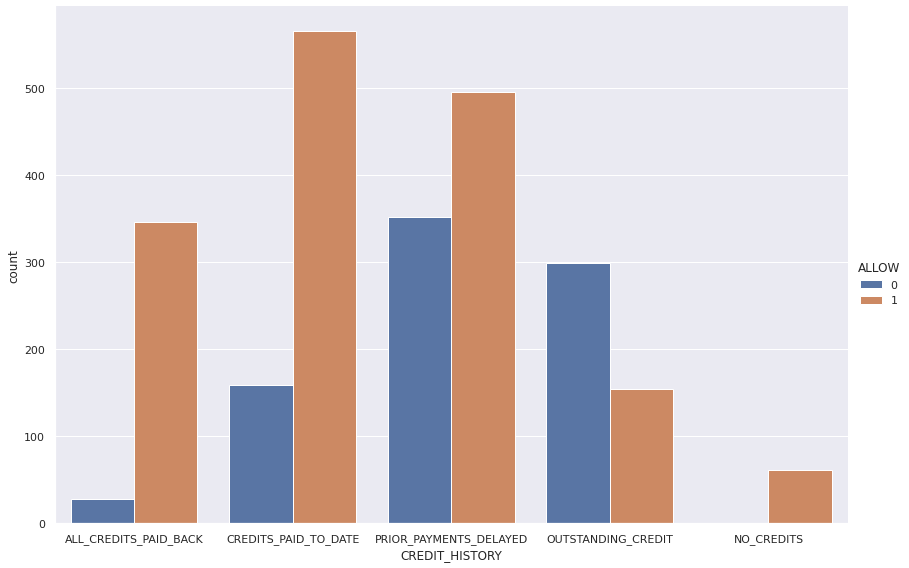

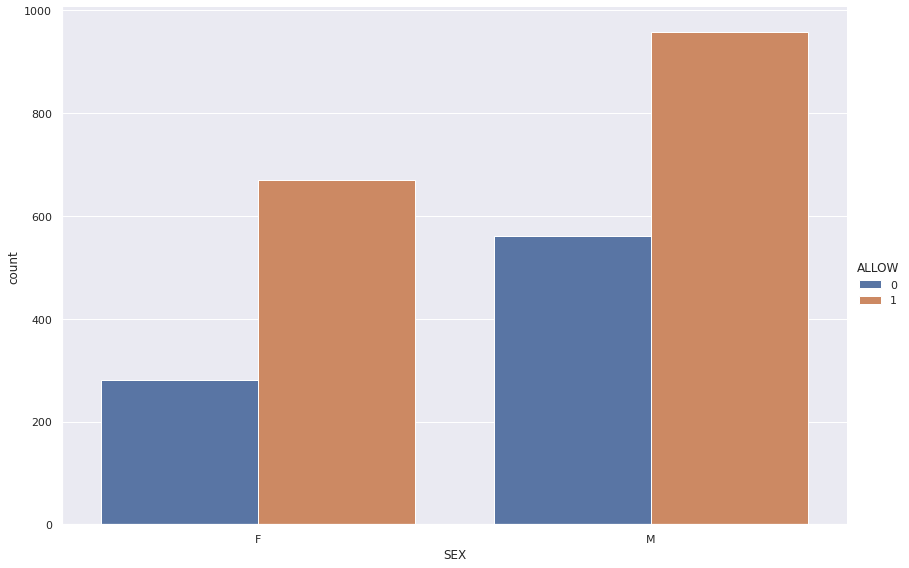

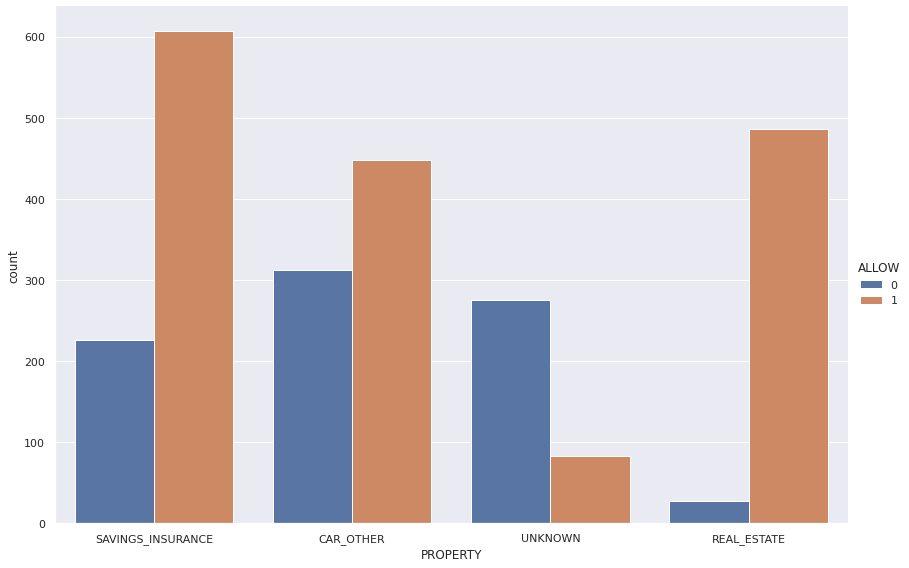

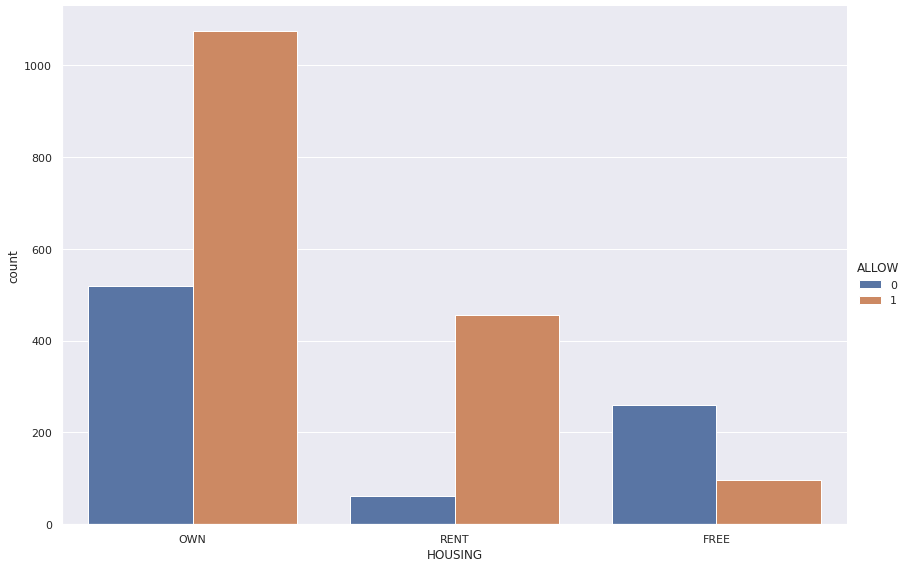

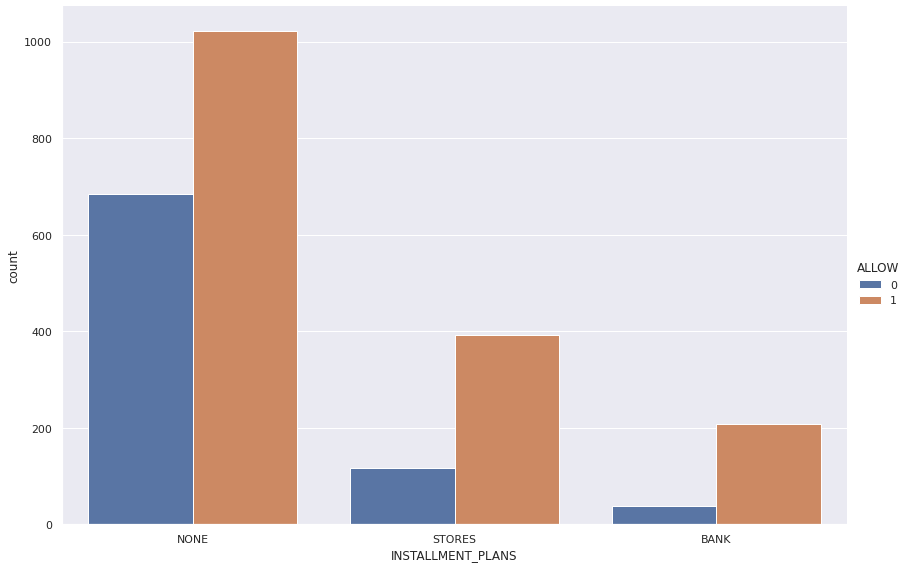

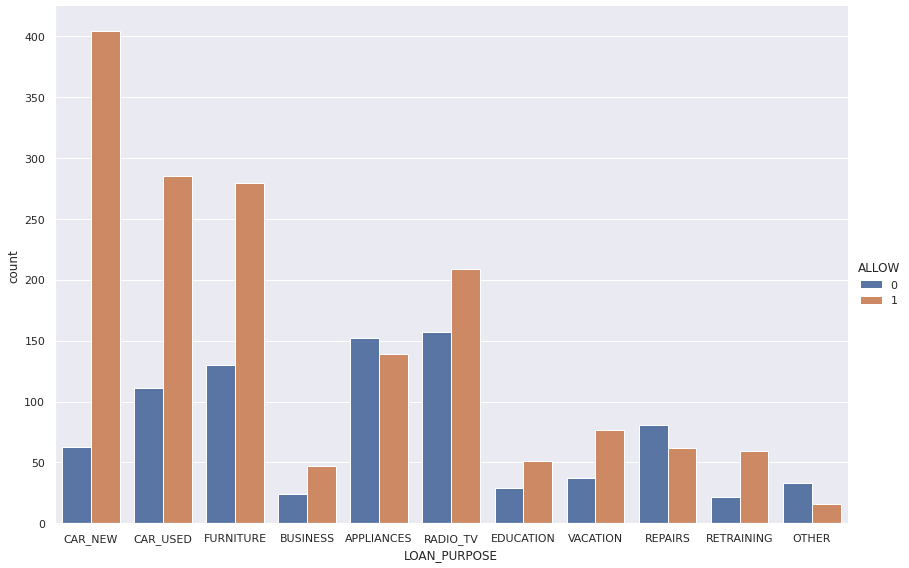

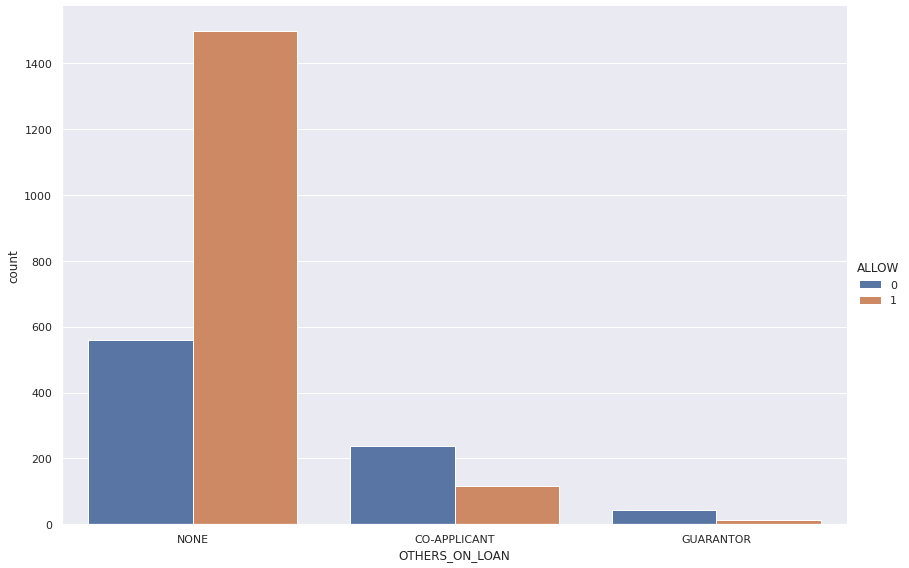

In [19]:
for var in categorical:
    sns.catplot(x=var, hue='ALLOW',data=df_merge_id, kind="count", height=8, aspect=12/8)

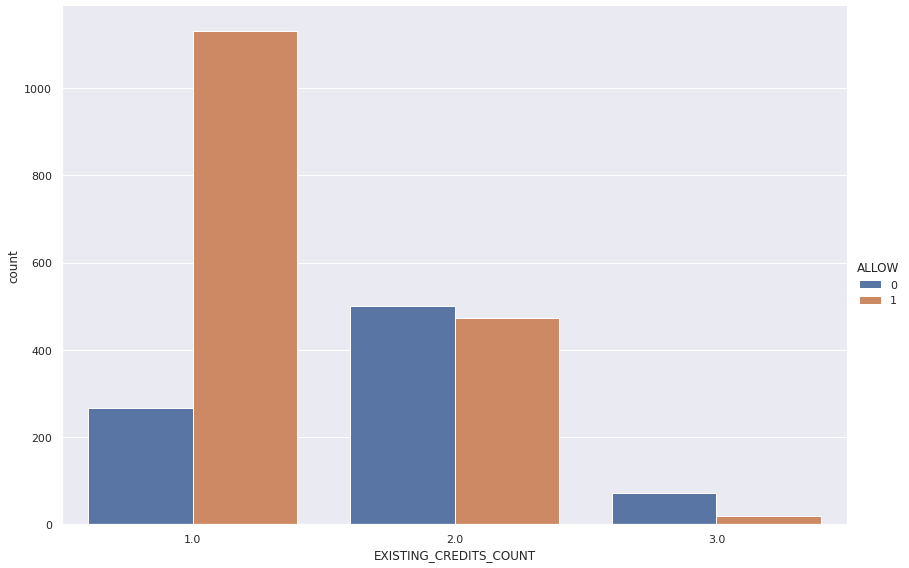

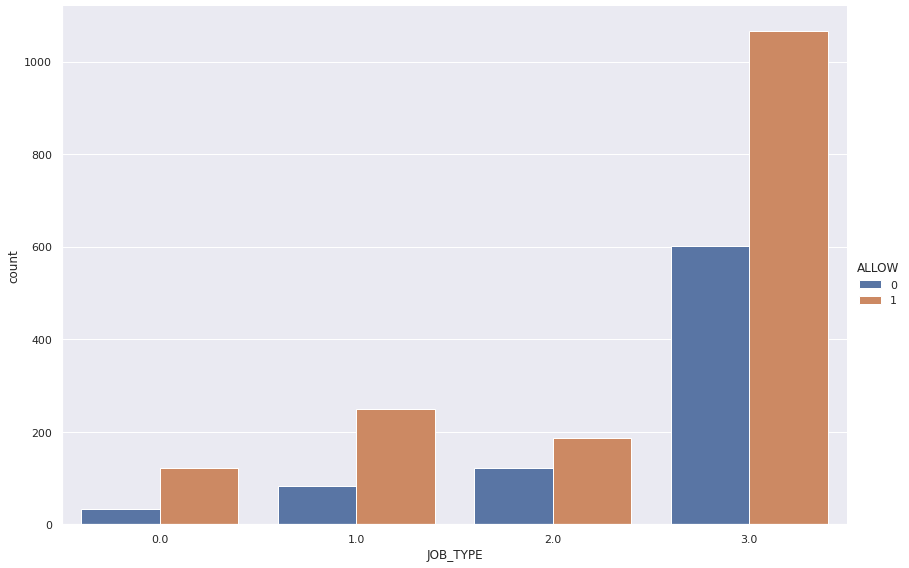

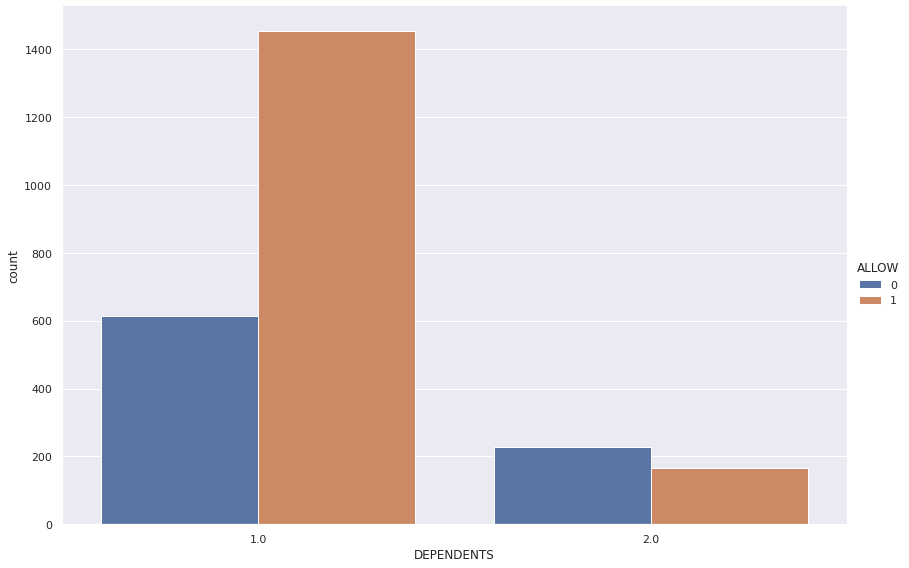

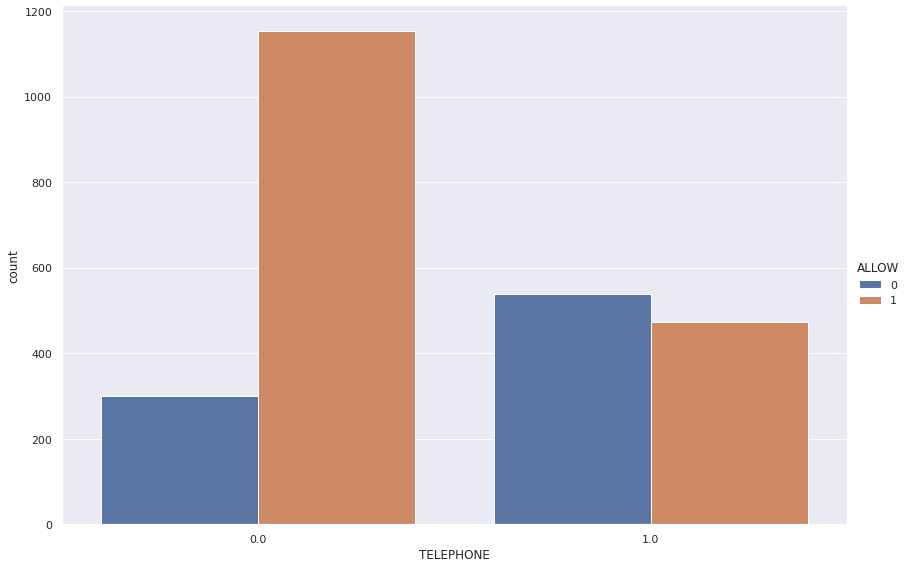

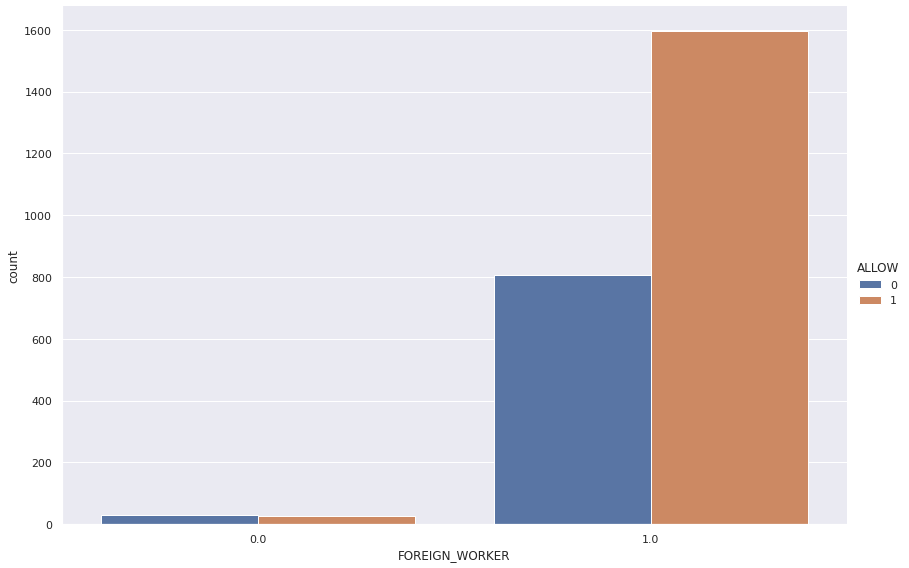

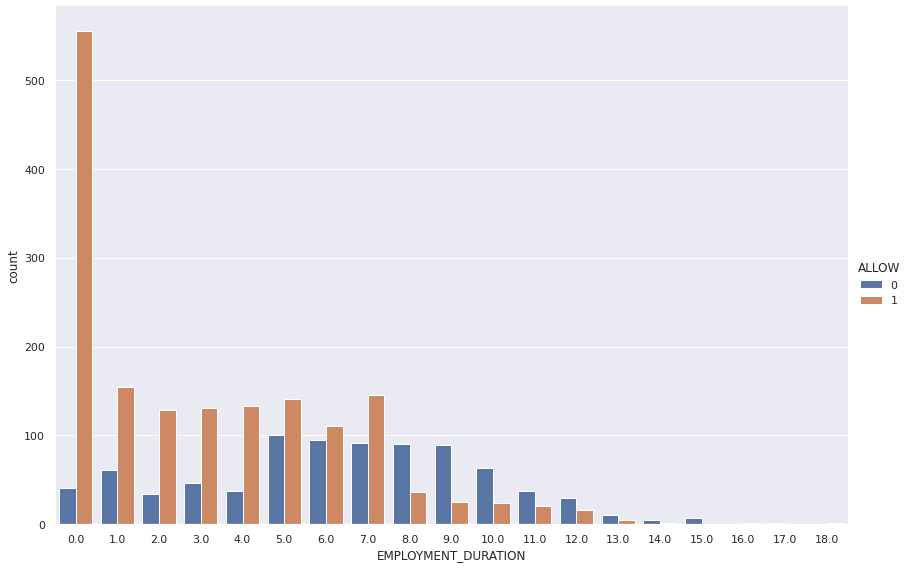

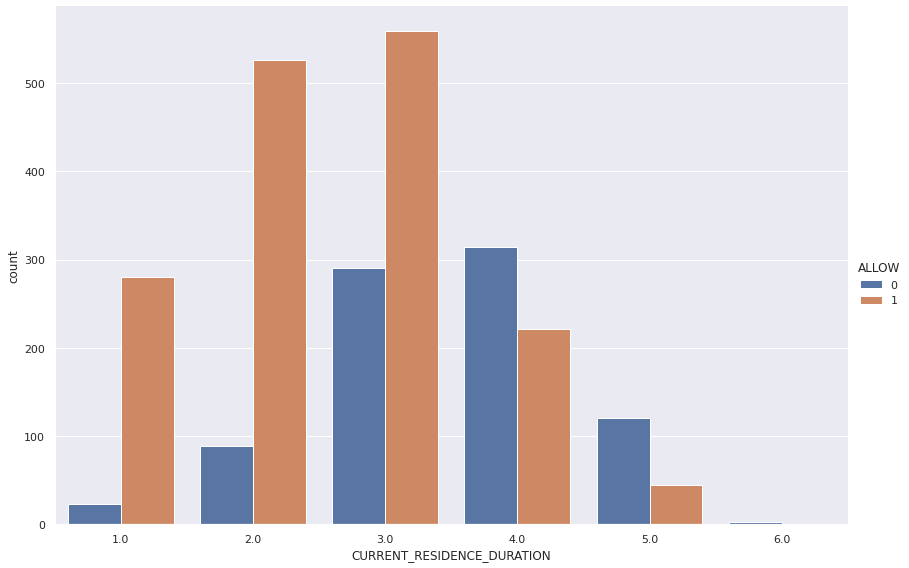

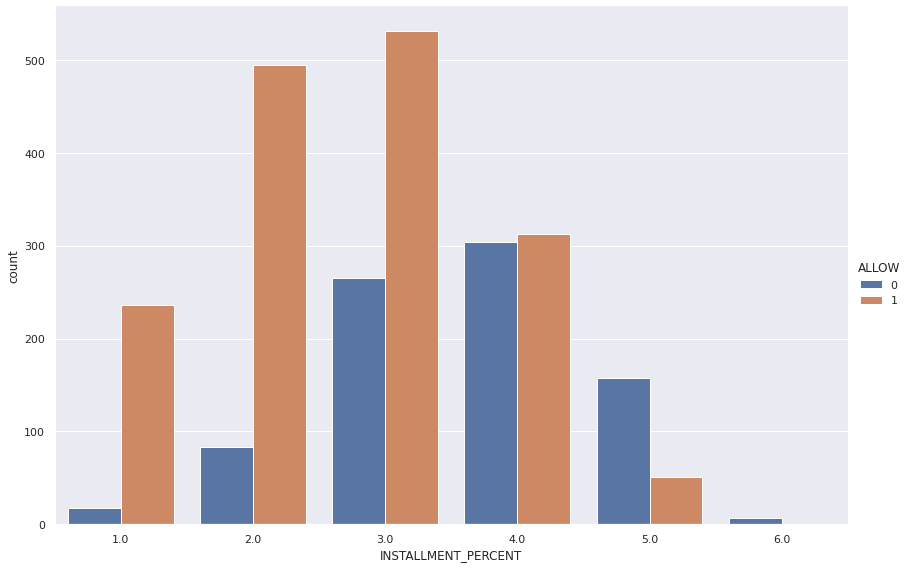

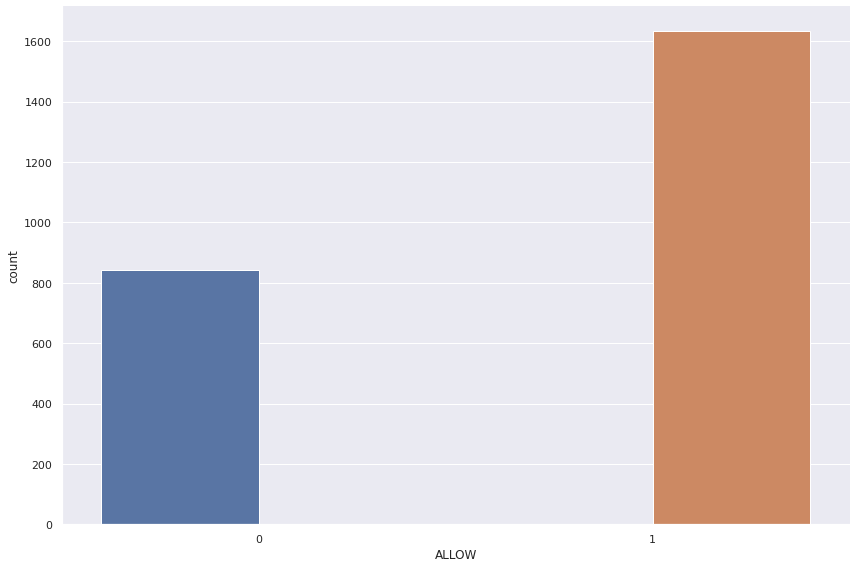

In [20]:
for var in discrete:
    sns.catplot(x=var, hue='ALLOW',data=df_merge_id, kind="count", height=8, aspect=12/8)

In [21]:
rcParams['figure.figsize'] = 14,8

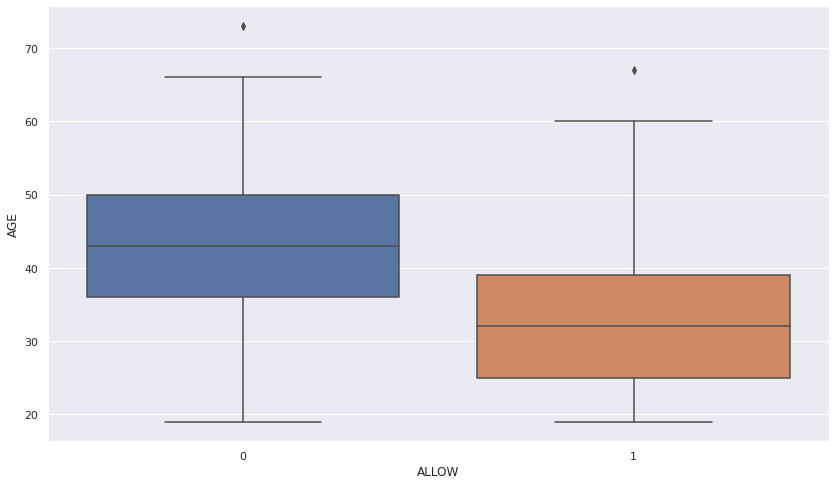

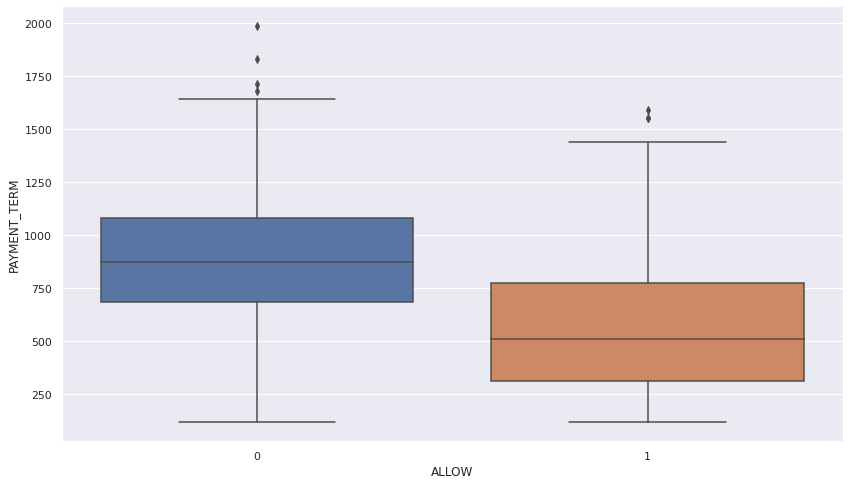

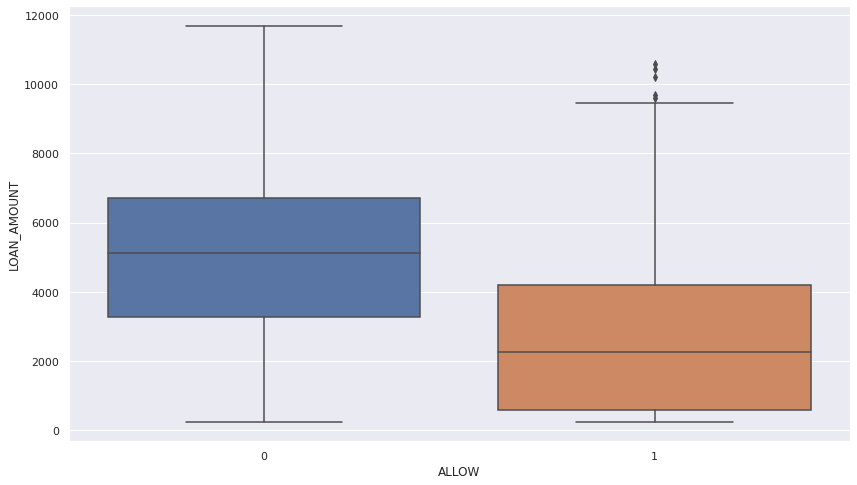

In [22]:
for e, var in enumerate(continuous[1:4]):
    sns.boxplot(x='ALLOW', y=var, data=df_merge_id)
    plt.show()

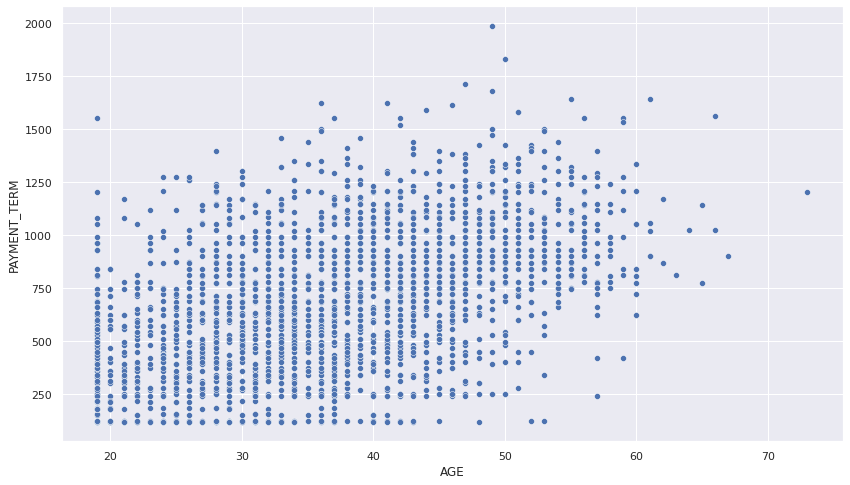

In [23]:
sns.scatterplot(data=df_merge_id, x="AGE", y="PAYMENT_TERM")

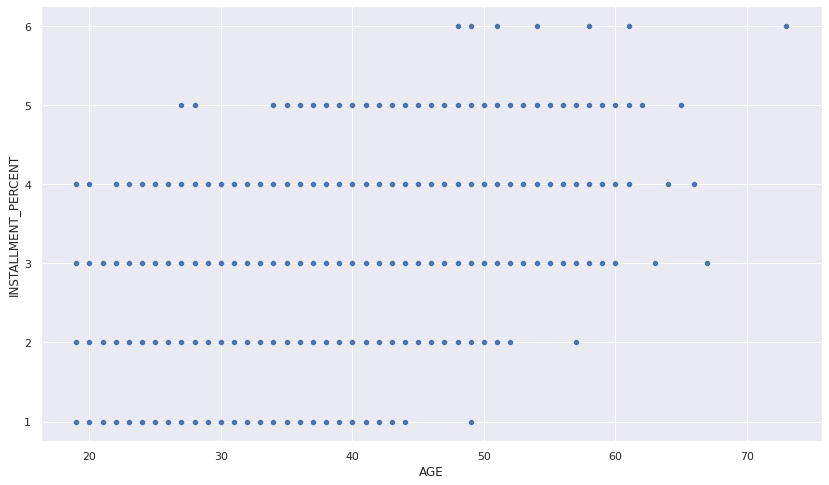

In [24]:
sns.scatterplot(data=df_merge_id, x="AGE", y="INSTALLMENT_PERCENT")

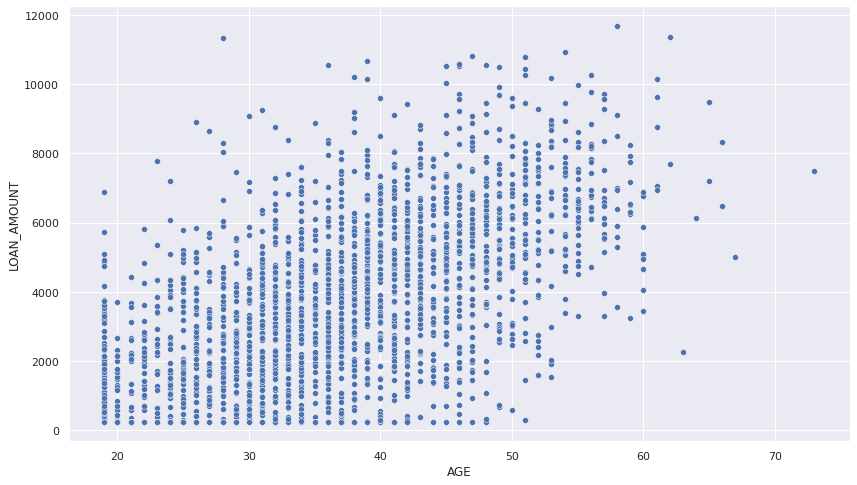

In [25]:
sns.scatterplot(data=df_merge_id, x="AGE", y="LOAN_AMOUNT")

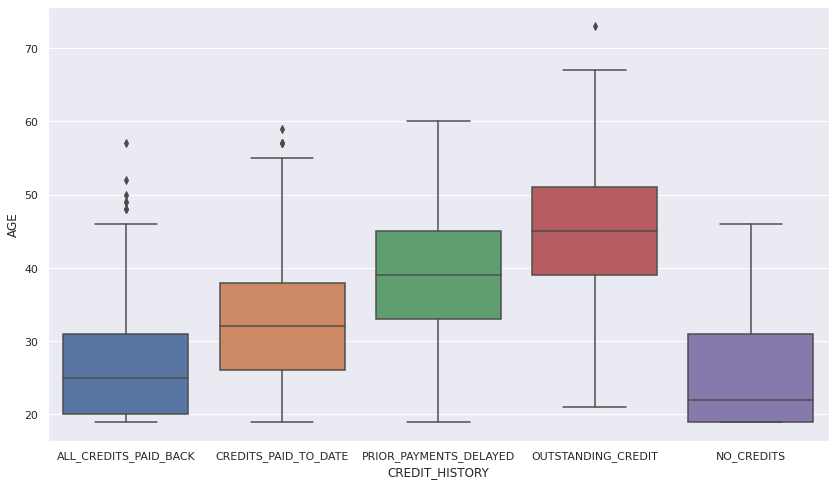

In [26]:
sns.boxplot(x='CREDIT_HISTORY', y='AGE', data=df_merge_id)

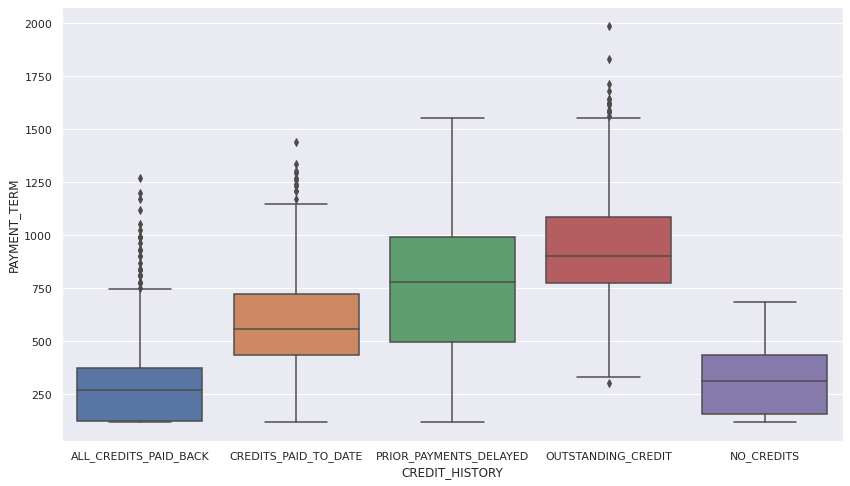

In [27]:
sns.boxplot(x='CREDIT_HISTORY', y='PAYMENT_TERM', data=df_merge_id)

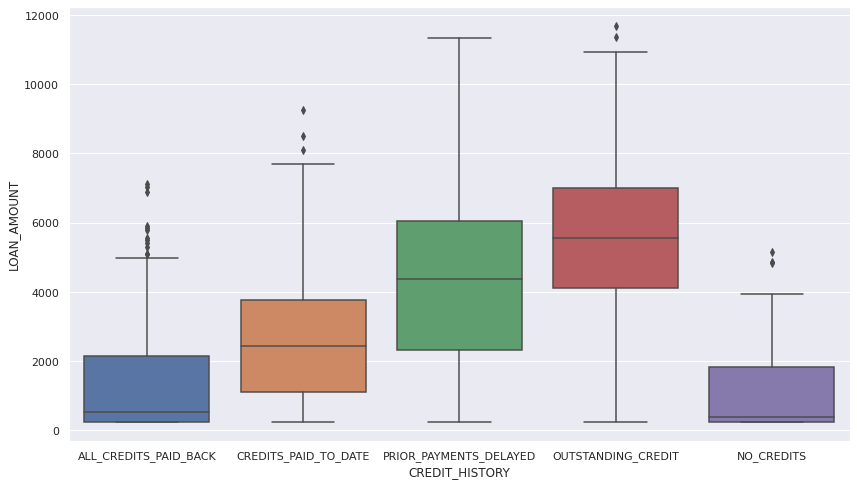

In [28]:
sns.boxplot(x='CREDIT_HISTORY', y='LOAN_AMOUNT', data=df_merge_id)

In [29]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df_merge_id.drop('ALLOW', axis=1),  
                                                        df_merge_id['ALLOW'],  
                                                        test_size=0.3,  
                                                        random_state=42,
                                                        stratify=df_merge_id['ALLOW'])  

In [30]:
X_train.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
975,277479,-128.3,OUTSTANDING_CREDIT,211.73,2.0,M,35.0,3.0,1.0,0.0,1.0,6.0,SAVINGS_INSURANCE,RENT,3.0,900.0,NONE,4.0,BUSINESS,4765.0,NONE
611,1310919,NO_CHECKING,OUTSTANDING_CREDIT,2906.97,2.0,M,51.0,3.0,2.0,1.0,1.0,8.0,CAR_OTHER,FREE,5.0,1147.0,NONE,5.0,RADIO_TV,7508.0,CO-APPLICANT
686,308396,-275.49,PRIOR_PAYMENTS_DELAYED,31.91,1.0,F,29.0,3.0,1.0,0.0,1.0,7.0,REAL_ESTATE,OWN,1.0,279.0,STORES,1.0,CAR_NEW,250.0,NONE
589,1074251,NO_CHECKING,OUTSTANDING_CREDIT,2006.39,2.0,F,36.0,2.0,1.0,1.0,1.0,5.0,UNKNOWN,OWN,4.0,961.0,NONE,4.0,REPAIRS,6118.0,NONE
1995,974723,NO_CHECKING,CREDITS_PAID_TO_DATE,53.29,1.0,M,28.0,3.0,1.0,0.0,0.0,1.0,REAL_ESTATE,RENT,2.0,248.0,NONE,3.0,CAR_NEW,2040.0,NONE


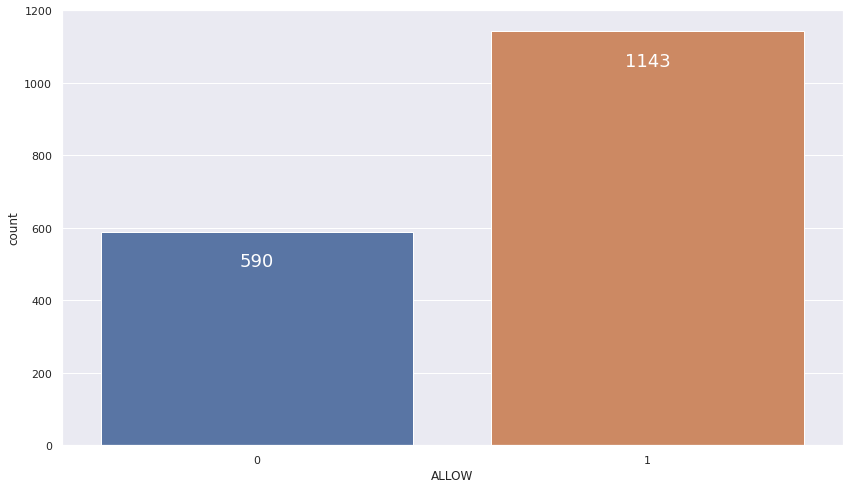

In [31]:
ax = sns.countplot(x="ALLOW", data=pd.DataFrame(y_train))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

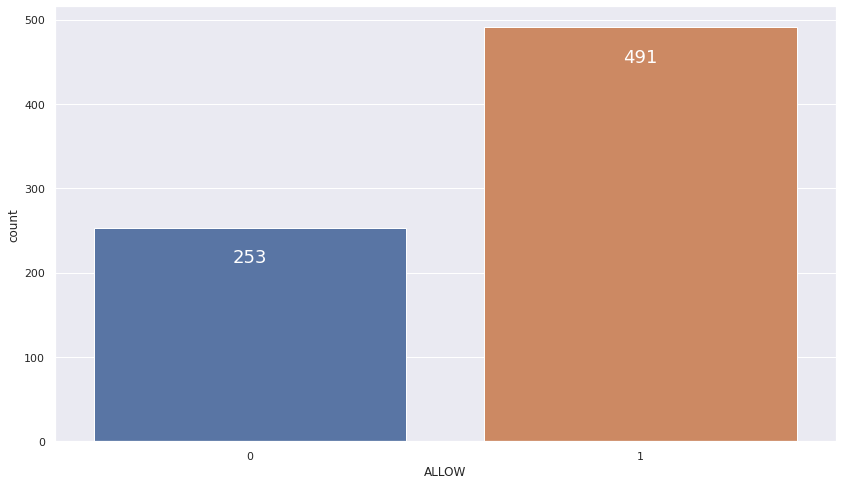

In [32]:
ax = sns.countplot(x="ALLOW", data=pd.DataFrame(y_test))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

In [33]:
# Replace "NO_CHECKING" in "CHECKING_BALANCE" for 0.0
X_train["CHECKING_BALANCE"].replace({"NO_CHECKING": 0.0}, inplace=True)
X_train["CHECKING_BALANCE"] = pd.to_numeric(X_train["CHECKING_BALANCE"], errors='coerce', downcast="float")

X_test["CHECKING_BALANCE"].replace({"NO_CHECKING": 0.0}, inplace=True)
X_test["CHECKING_BALANCE"] = pd.to_numeric(X_test["CHECKING_BALANCE"], errors='coerce', downcast="float")

In [34]:
# Replace "UNKNOWN" in "EXISTING_SAVINGS" for nan values
X_train["EXISTING_SAVINGS"].replace({"UNKNOWN": np.NaN}, inplace=True)
X_train["EXISTING_SAVINGS"] = pd.to_numeric(X_train["EXISTING_SAVINGS"], errors='coerce', downcast="float")

X_test["EXISTING_SAVINGS"].replace({"UNKNOWN": np.NaN}, inplace=True)
X_test["EXISTING_SAVINGS"] = pd.to_numeric(X_test["EXISTING_SAVINGS"], errors='coerce', downcast="float")

In [35]:
# Search for constant variables
constant_features = [feat for feat in X_train.columns if X_train[feat].nunique()==1]
constant_features

[]

In [36]:
# Drop constant variables
X_train.drop(labels=constant_features, axis=1, inplace=True)
X_test.drop(labels=constant_features, axis=1, inplace=True)

In [37]:
# Search for Quasi-constant variables
quasi_constant_features = []

for feat in X_train.columns:
    highest_count = (X_train[feat].value_counts() / np.float(len(X_train))).sort_values(ascending=False).values[0]

    if highest_count >= 0.95:
        quasi_constant_features.append(feat)

quasi_constant_features

['FOREIGN_WORKER']

In [38]:
# Drop Quasi-constant variables
X_train.drop(labels=quasi_constant_features, axis=1, inplace=True)
X_test.drop(labels=quasi_constant_features, axis=1, inplace=True)

In [39]:
# Missing categorical imputation
for var in categorical:
    X_train[var].fillna('MISSING', inplace=True)
    X_test[var].fillna('MISSING', inplace=True)

In [40]:
X_train.isnull().mean()

ID                            0.000000
CHECKING_BALANCE              0.004039
CREDIT_HISTORY                0.000000
EXISTING_SAVINGS              0.077323
EXISTING_CREDITS_COUNT        0.004039
SEX                           0.000000
AGE                           0.004039
JOB_TYPE                      0.005770
DEPENDENTS                    0.008078
TELEPHONE                     0.005770
EMPLOYMENT_DURATION           0.002308
PROPERTY                      0.000000
HOUSING                       0.000000
CURRENT_RESIDENCE_DURATION    0.002308
PAYMENT_TERM                  0.006347
INSTALLMENT_PLANS             0.000000
INSTALLMENT_PERCENT           0.006347
LOAN_PURPOSE                  0.000000
LOAN_AMOUNT                   0.005193
OTHERS_ON_LOAN                0.000000
dtype: float64

In [41]:
# Check variables with less than 5% of missing values to do mean/median imputation 
# without missing indicator.
low_missing = []
high_missing = []
for col, value in X_train.isnull().mean().iteritems():
    if value <= 0.05 and value!=0.0:
        low_missing.append(col)
    elif value > 0.05:
        high_missing.append(col)
print(low_missing)
print(high_missing)

['CHECKING_BALANCE', 'EXISTING_CREDITS_COUNT', 'AGE', 'JOB_TYPE', 'DEPENDENTS', 'TELEPHONE', 'EMPLOYMENT_DURATION', 'CURRENT_RESIDENCE_DURATION', 'PAYMENT_TERM', 'INSTALLMENT_PERCENT', 'LOAN_AMOUNT']
['EXISTING_SAVINGS']


In [42]:
train_t = X_train
test_t = X_test

In [43]:
train_t.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
975,277479,-128.300003,OUTSTANDING_CREDIT,211.729996,2.0,M,35.0,3.0,1.0,0.0,6.0,SAVINGS_INSURANCE,RENT,3.0,900.0,NONE,4.0,BUSINESS,4765.0,NONE
611,1310919,0.000000,OUTSTANDING_CREDIT,2906.969971,2.0,M,51.0,3.0,2.0,1.0,8.0,CAR_OTHER,FREE,5.0,1147.0,NONE,5.0,RADIO_TV,7508.0,CO-APPLICANT
686,308396,-275.489990,PRIOR_PAYMENTS_DELAYED,31.910000,1.0,F,29.0,3.0,1.0,0.0,7.0,REAL_ESTATE,OWN,1.0,279.0,STORES,1.0,CAR_NEW,250.0,NONE
589,1074251,0.000000,OUTSTANDING_CREDIT,2006.390015,2.0,F,36.0,2.0,1.0,1.0,5.0,UNKNOWN,OWN,4.0,961.0,NONE,4.0,REPAIRS,6118.0,NONE
1995,974723,0.000000,CREDITS_PAID_TO_DATE,53.290001,1.0,M,28.0,3.0,1.0,0.0,1.0,REAL_ESTATE,RENT,2.0,248.0,NONE,3.0,CAR_NEW,2040.0,NONE


In [44]:
test_t.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
197,472686,-48.090000,CREDITS_PAID_TO_DATE,50.880001,2.0,M,31.0,0.0,1.0,0.0,7.0,CAR_OTHER,OWN,3.0,1110.0,BANK,3.0,EDUCATION,4892.0,NONE
937,110738,56.070000,PRIOR_PAYMENTS_DELAYED,4448.109863,2.0,F,45.0,3.0,1.0,1.0,6.0,CAR_OTHER,OWN,4.0,990.0,NONE,3.0,CAR_USED,3130.0,CO-APPLICANT
106,649033,0.000000,CREDITS_PAID_TO_DATE,8014.600098,2.0,M,32.0,1.0,1.0,1.0,2.0,UNKNOWN,OWN,4.0,630.0,STORES,3.0,CAR_USED,6850.0,NONE
334,124502,0.000000,OUTSTANDING_CREDIT,936.099976,2.0,M,54.0,3.0,1.0,1.0,7.0,UNKNOWN,FREE,3.0,837.0,NONE,4.0,RADIO_TV,5678.0,NONE
1747,1281972,192.770004,CREDITS_PAID_TO_DATE,28.920000,1.0,F,29.0,3.0,1.0,0.0,0.0,REAL_ESTATE,OWN,2.0,630.0,NONE,1.0,MISSING,2219.0,NONE


In [45]:
# Median imputation
mean_median_variables = low_missing + high_missing
median_imputer = MeanMedianImputer(imputation_method='median', variables=mean_median_variables)

median_imputer.fit(train_t)
train_t = median_imputer.transform(train_t)
test_t = median_imputer.transform(test_t)

In [46]:
train_t.isnull().mean()

ID                            0.0
CHECKING_BALANCE              0.0
CREDIT_HISTORY                0.0
EXISTING_SAVINGS              0.0
EXISTING_CREDITS_COUNT        0.0
SEX                           0.0
AGE                           0.0
JOB_TYPE                      0.0
DEPENDENTS                    0.0
TELEPHONE                     0.0
EMPLOYMENT_DURATION           0.0
PROPERTY                      0.0
HOUSING                       0.0
CURRENT_RESIDENCE_DURATION    0.0
PAYMENT_TERM                  0.0
INSTALLMENT_PLANS             0.0
INSTALLMENT_PERCENT           0.0
LOAN_PURPOSE                  0.0
LOAN_AMOUNT                   0.0
OTHERS_ON_LOAN                0.0
dtype: float64

In [47]:
test_t.isnull().mean()

ID                            0.0
CHECKING_BALANCE              0.0
CREDIT_HISTORY                0.0
EXISTING_SAVINGS              0.0
EXISTING_CREDITS_COUNT        0.0
SEX                           0.0
AGE                           0.0
JOB_TYPE                      0.0
DEPENDENTS                    0.0
TELEPHONE                     0.0
EMPLOYMENT_DURATION           0.0
PROPERTY                      0.0
HOUSING                       0.0
CURRENT_RESIDENCE_DURATION    0.0
PAYMENT_TERM                  0.0
INSTALLMENT_PLANS             0.0
INSTALLMENT_PERCENT           0.0
LOAN_PURPOSE                  0.0
LOAN_AMOUNT                   0.0
OTHERS_ON_LOAN                0.0
dtype: float64

In [48]:
train_t.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
975,277479,-128.300003,OUTSTANDING_CREDIT,211.729996,2.0,M,35.0,3.0,1.0,0.0,6.0,SAVINGS_INSURANCE,RENT,3.0,900.0,NONE,4.0,BUSINESS,4765.0,NONE
611,1310919,0.000000,OUTSTANDING_CREDIT,2906.969971,2.0,M,51.0,3.0,2.0,1.0,8.0,CAR_OTHER,FREE,5.0,1147.0,NONE,5.0,RADIO_TV,7508.0,CO-APPLICANT
686,308396,-275.489990,PRIOR_PAYMENTS_DELAYED,31.910000,1.0,F,29.0,3.0,1.0,0.0,7.0,REAL_ESTATE,OWN,1.0,279.0,STORES,1.0,CAR_NEW,250.0,NONE
589,1074251,0.000000,OUTSTANDING_CREDIT,2006.390015,2.0,F,36.0,2.0,1.0,1.0,5.0,UNKNOWN,OWN,4.0,961.0,NONE,4.0,REPAIRS,6118.0,NONE
1995,974723,0.000000,CREDITS_PAID_TO_DATE,53.290001,1.0,M,28.0,3.0,1.0,0.0,1.0,REAL_ESTATE,RENT,2.0,248.0,NONE,3.0,CAR_NEW,2040.0,NONE


In [49]:
test_t.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
197,472686,-48.090000,CREDITS_PAID_TO_DATE,50.880001,2.0,M,31.0,0.0,1.0,0.0,7.0,CAR_OTHER,OWN,3.0,1110.0,BANK,3.0,EDUCATION,4892.0,NONE
937,110738,56.070000,PRIOR_PAYMENTS_DELAYED,4448.109863,2.0,F,45.0,3.0,1.0,1.0,6.0,CAR_OTHER,OWN,4.0,990.0,NONE,3.0,CAR_USED,3130.0,CO-APPLICANT
106,649033,0.000000,CREDITS_PAID_TO_DATE,8014.600098,2.0,M,32.0,1.0,1.0,1.0,2.0,UNKNOWN,OWN,4.0,630.0,STORES,3.0,CAR_USED,6850.0,NONE
334,124502,0.000000,OUTSTANDING_CREDIT,936.099976,2.0,M,54.0,3.0,1.0,1.0,7.0,UNKNOWN,FREE,3.0,837.0,NONE,4.0,RADIO_TV,5678.0,NONE
1747,1281972,192.770004,CREDITS_PAID_TO_DATE,28.920000,1.0,F,29.0,3.0,1.0,0.0,0.0,REAL_ESTATE,OWN,2.0,630.0,NONE,1.0,MISSING,2219.0,NONE


In [50]:
train_t.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1733 entries, 975 to 703
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          1733 non-null   int64  
 1   CHECKING_BALANCE            1733 non-null   float32
 2   CREDIT_HISTORY              1733 non-null   object 
 3   EXISTING_SAVINGS            1733 non-null   float32
 4   EXISTING_CREDITS_COUNT      1733 non-null   float64
 5   SEX                         1733 non-null   object 
 6   AGE                         1733 non-null   float64
 7   JOB_TYPE                    1733 non-null   float64
 8   DEPENDENTS                  1733 non-null   float64
 9   TELEPHONE                   1733 non-null   float64
 10  EMPLOYMENT_DURATION         1733 non-null   float64
 11  PROPERTY                    1733 non-null   object 
 12  HOUSING                     1733 non-null   object 
 13  CURRENT_RESIDENCE_DURATION  1733

In [51]:
train_t['CREDIT_HISTORY'].value_counts()

PRIOR_PAYMENTS_DELAYED    598
CREDITS_PAID_TO_DATE      499
OUTSTANDING_CREDIT        315
ALL_CREDITS_PAID_BACK     268
NO_CREDITS                 44
MISSING                     9
Name: CREDIT_HISTORY, dtype: int64

In [52]:
# Weight of Evidence Encoding
woe_encoder = WoEEncoder(variables=['SEX', 'PROPERTY', 'HOUSING', 'INSTALLMENT_PLANS', 'LOAN_PURPOSE', 'OTHERS_ON_LOAN'])

woe_encoder.fit(train_t, y_train)

train_t = woe_encoder.transform(train_t)
test_t = woe_encoder.transform(test_t)

In [53]:
# Ordinal Encoding
ordinal_encoder = OrdinalEncoder(encoding_method='ordered', variables=['CREDIT_HISTORY'])

ordinal_encoder.fit(train_t, y_train)

train_t = ordinal_encoder.transform(train_t)
test_t = ordinal_encoder.transform(test_t)

In [54]:
train_t.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
975,277479,-128.300003,0,211.729996,2.0,-0.086748,35.0,3.0,1.0,0.0,6.0,0.267123,1.526366,3.0,900.0,-0.242634,4.0,0.002005,4765.0,0.330143
611,1310919,0.000000,0,2906.969971,2.0,-0.086748,51.0,3.0,2.0,1.0,8.0,-0.263463,-1.598971,5.0,1147.0,-0.242634,5.0,-0.427296,7508.0,-1.366558
686,308396,-275.489990,1,31.910000,1.0,0.131942,29.0,3.0,1.0,0.0,7.0,2.183620,0.064381,1.0,279.0,0.556009,1.0,1.095131,250.0,0.330143
589,1074251,0.000000,0,2006.390015,2.0,0.131942,36.0,2.0,1.0,1.0,5.0,-1.955210,0.064381,4.0,961.0,-0.242634,4.0,-0.977626,6118.0,0.330143
1995,974723,0.000000,3,53.290001,1.0,-0.086748,28.0,3.0,1.0,0.0,1.0,2.183620,1.526366,2.0,248.0,-0.242634,3.0,1.095131,2040.0,0.330143


In [55]:
train_t.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1733 entries, 975 to 703
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          1733 non-null   int64  
 1   CHECKING_BALANCE            1733 non-null   float32
 2   CREDIT_HISTORY              1733 non-null   int64  
 3   EXISTING_SAVINGS            1733 non-null   float32
 4   EXISTING_CREDITS_COUNT      1733 non-null   float64
 5   SEX                         1733 non-null   float64
 6   AGE                         1733 non-null   float64
 7   JOB_TYPE                    1733 non-null   float64
 8   DEPENDENTS                  1733 non-null   float64
 9   TELEPHONE                   1733 non-null   float64
 10  EMPLOYMENT_DURATION         1733 non-null   float64
 11  PROPERTY                    1733 non-null   float64
 12  HOUSING                     1733 non-null   float64
 13  CURRENT_RESIDENCE_DURATION  1733

In [56]:
# Drop "ID" column
train_t.drop('ID', axis=1, inplace=True)
test_t.drop('ID', axis=1, inplace=True)

In [57]:
# Left outer join
z1 = pd.merge(df_loans, df_dem, how='inner', on=['ID'])
z1 = z1.dropna()
merge_data_not_in_X_train = pd.merge(z1, df_acc, on=['ID'], how="outer", 
                                        indicator=True).query('_merge=="left_only"')
merge_data_not_in_X_train.drop(labels=['_merge'], axis=1, inplace=True)

In [58]:
merge_data_not_in_X_train.head()

,ID,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT
0,24252,1080.0,NONE,4.0,APPLIANCES,5927.0,CO-APPLICANT,0.0,M,47.0,3.0,1.0,0.0,1.0,14.0,SAVINGS_INSURANCE,OWN,3.0,NaN,NaN,NaN,NaN
1,1002018,124.0,STORES,1.0,CAR_NEW,250.0,NONE,1.0,M,19.0,3.0,1.0,0.0,1.0,0.0,SAVINGS_INSURANCE,RENT,2.0,NaN,NaN,NaN,NaN
2,1240455,930.0,NONE,4.0,EDUCATION,6500.0,NONE,0.0,F,50.0,2.0,1.0,1.0,1.0,7.0,UNKNOWN,OWN,3.0,NaN,NaN,NaN,NaN
3,107799,527.0,NONE,2.0,CAR_USED,1841.0,NONE,1.0,M,35.0,3.0,1.0,0.0,1.0,0.0,REAL_ESTATE,OWN,2.0,NaN,NaN,NaN,NaN
4,184883,1147.0,STORES,3.0,CAR_USED,6616.0,CO-APPLICANT,0.0,M,40.0,1.0,1.0,0.0,1.0,9.0,CAR_OTHER,OWN,4.0,NaN,NaN,NaN,NaN


In [59]:
merge_data_not_in_X_train.isnull().mean()

ID                            0.0
PAYMENT_TERM                  0.0
INSTALLMENT_PLANS             0.0
INSTALLMENT_PERCENT           0.0
LOAN_PURPOSE                  0.0
LOAN_AMOUNT                   0.0
OTHERS_ON_LOAN                0.0
ALLOW                         0.0
SEX                           0.0
AGE                           0.0
JOB_TYPE                      0.0
DEPENDENTS                    0.0
TELEPHONE                     0.0
FOREIGN_WORKER                0.0
EMPLOYMENT_DURATION           0.0
PROPERTY                      0.0
HOUSING                       0.0
CURRENT_RESIDENCE_DURATION    0.0
CHECKING_BALANCE              1.0
CREDIT_HISTORY                1.0
EXISTING_SAVINGS              1.0
EXISTING_CREDITS_COUNT        1.0
dtype: float64

In [60]:
merge_data_not_in_X_train_labels = merge_data_not_in_X_train['ALLOW']

In [61]:
merge_data_not_in_X_train.drop(labels=['ALLOW'], axis=1, inplace=True)

In [62]:
# Replace "NO_CHECKING" in "CHECKING_BALANCE" for 0.0
merge_data_not_in_X_train["CHECKING_BALANCE"].replace({"NO_CHECKING": 0.0}, inplace=True)
merge_data_not_in_X_train["CHECKING_BALANCE"] = pd.to_numeric(merge_data_not_in_X_train["CHECKING_BALANCE"], errors='coerce', downcast="float")

In [63]:
# Replace "UNKNOWN" in "EXISTING_SAVINGS" for nan values
merge_data_not_in_X_train["EXISTING_SAVINGS"].replace({"UNKNOWN": np.NaN}, inplace=True)
merge_data_not_in_X_train["EXISTING_SAVINGS"] = pd.to_numeric(merge_data_not_in_X_train["EXISTING_SAVINGS"], errors='coerce', downcast="float")

In [64]:
merge_data_not_in_X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1332 entries, 0 to 1331
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          1332 non-null   int64  
 1   PAYMENT_TERM                1332 non-null   float64
 2   INSTALLMENT_PLANS           1332 non-null   object 
 3   INSTALLMENT_PERCENT         1332 non-null   float64
 4   LOAN_PURPOSE                1332 non-null   object 
 5   LOAN_AMOUNT                 1332 non-null   float64
 6   OTHERS_ON_LOAN              1332 non-null   object 
 7   SEX                         1332 non-null   object 
 8   AGE                         1332 non-null   float64
 9   JOB_TYPE                    1332 non-null   float64
 10  DEPENDENTS                  1332 non-null   float64
 11  TELEPHONE                   1332 non-null   float64
 12  FOREIGN_WORKER              1332 non-null   float64
 13  EMPLOYMENT_DURATION         1332 

In [65]:
# Drop constant variables
merge_data_not_in_X_train.drop(labels=constant_features, axis=1, inplace=True)

In [66]:
# Drop Quasi-constant variables
merge_data_not_in_X_train.drop(labels=quasi_constant_features, axis=1, inplace=True)

In [67]:
# Missing categorical imputation
for var in categorical:
    merge_data_not_in_X_train[var].fillna('MISSING', inplace=True)

In [68]:
# Median imputation
merge_data_not_in_X_train = median_imputer.transform(merge_data_not_in_X_train)

In [69]:
# Weight of Evidence Encoding
merge_data_not_in_X_train = woe_encoder.transform(merge_data_not_in_X_train)

In [70]:
# Ordinal Encoding
merge_data_not_in_X_train = ordinal_encoder.transform(merge_data_not_in_X_train)

In [71]:
# Drop "ID" column
merge_data_not_in_X_train.drop('ID', axis=1, inplace=True)

In [72]:
merge_data_not_in_X_train.isnull().mean()

PAYMENT_TERM                  0.0
INSTALLMENT_PLANS             0.0
INSTALLMENT_PERCENT           0.0
LOAN_PURPOSE                  0.0
LOAN_AMOUNT                   0.0
OTHERS_ON_LOAN                0.0
SEX                           0.0
AGE                           0.0
JOB_TYPE                      0.0
DEPENDENTS                    0.0
TELEPHONE                     0.0
EMPLOYMENT_DURATION           0.0
PROPERTY                      0.0
HOUSING                       0.0
CURRENT_RESIDENCE_DURATION    0.0
CHECKING_BALANCE              0.0
CREDIT_HISTORY                0.0
EXISTING_SAVINGS              0.0
EXISTING_CREDITS_COUNT        0.0
dtype: float64

In [73]:
train_t = pd.concat([train_t, merge_data_not_in_X_train], axis=0)
y_train = pd.concat([y_train, merge_data_not_in_X_train_labels], axis=0)

In [74]:
train_t.isnull().mean()

CHECKING_BALANCE              0.0
CREDIT_HISTORY                0.0
EXISTING_SAVINGS              0.0
EXISTING_CREDITS_COUNT        0.0
SEX                           0.0
AGE                           0.0
JOB_TYPE                      0.0
DEPENDENTS                    0.0
TELEPHONE                     0.0
EMPLOYMENT_DURATION           0.0
PROPERTY                      0.0
HOUSING                       0.0
CURRENT_RESIDENCE_DURATION    0.0
PAYMENT_TERM                  0.0
INSTALLMENT_PLANS             0.0
INSTALLMENT_PERCENT           0.0
LOAN_PURPOSE                  0.0
LOAN_AMOUNT                   0.0
OTHERS_ON_LOAN                0.0
dtype: float64

In [75]:
train_t

,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
975,-128.300003,0,211.729996,2.0,-0.086748,35.0,3.0,1.0,0.0,6.0,0.267123,1.526366,3.0,900.0,-0.242634,4.0,0.002005,4765.0,0.330143
611,0.000000,0,2906.969971,2.0,-0.086748,51.0,3.0,2.0,1.0,8.0,-0.263463,-1.598971,5.0,1147.0,-0.242634,5.0,-0.427296,7508.0,-1.366558
686,-275.489990,1,31.910000,1.0,0.131942,29.0,3.0,1.0,0.0,7.0,2.183620,0.064381,1.0,279.0,0.556009,1.0,1.095131,250.0,0.330143
589,0.000000,0,2006.390015,2.0,0.131942,36.0,2.0,1.0,1.0,5.0,-1.955210,0.064381,4.0,961.0,-0.242634,4.0,-0.977626,6118.0,0.330143
1995,0.000000,3,53.290001,1.0,-0.086748,28.0,3.0,1.0,0.0,1.0,2.183620,1.526366,2.0,248.0,-0.242634,3.0,1.095131,2040.0,0.330143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1327,0.000000,2,277.859985,1.0,-0.086748,53.0,2.0,2.0,1.0,6.0,-1.955210,-1.598971,4.0,900.0,-0.242634,4.0,0.002005,5899.0,0.330143
1328,0.000000,2,277.859985,1.0,-0.086748,38.0,3.0,1.0,0.0,9.0,0.267123,0.064381,4.0,713.0,-0.242634,4.0,0.116118,6959.0,0.330143
1329,0.000000,2,277.859985,1.0,-0.086748,51.0,3.0,1.0,1.0,6.0,-0.263463,0.064381,4.0,806.0,-0.242634,4.0,-0.427296,6158.0,0.330143
1330,0.000000,2,277.859985,1.0,-0.086748,31.0,1.0,1.0,0.0,2.0,0.267123,0.064381,2.0,540.0,0.556009,3.0,1.095131,1939.0,0.330143


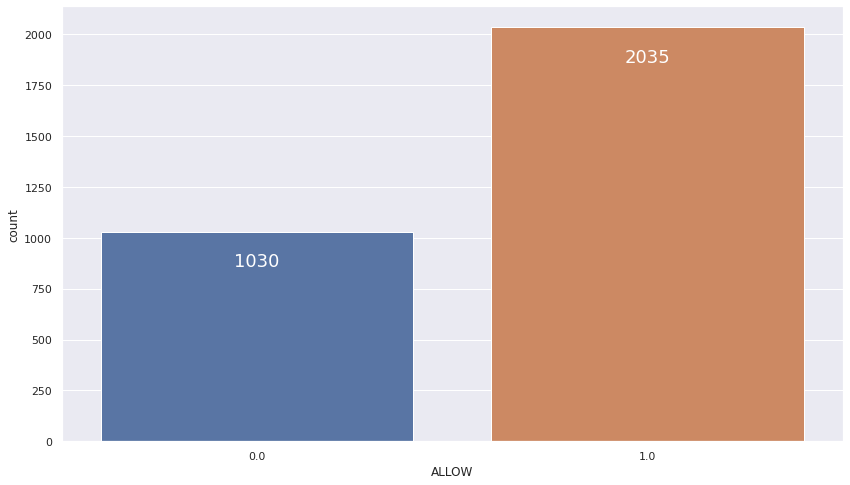

In [76]:
ax = sns.countplot(x="ALLOW", data=pd.DataFrame(y_train))

for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.4, p.get_height()), ha='center', va='top', color='white', size=18)

In [77]:
bord_smote = BorderlineSMOTE(
    sampling_strategy='auto',
    random_state=42,  
    k_neighbors=5, 
    m_neighbors=10, 
    kind='borderline-1',
    n_jobs=2
)

In [78]:
X, y = bord_smote.fit_resample(train_t, y_train)

In [79]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CHECKING_BALANCE            4070 non-null   float32
 1   CREDIT_HISTORY              4070 non-null   int64  
 2   EXISTING_SAVINGS            4070 non-null   float32
 3   EXISTING_CREDITS_COUNT      4070 non-null   float64
 4   SEX                         4070 non-null   float64
 5   AGE                         4070 non-null   float64
 6   JOB_TYPE                    4070 non-null   float64
 7   DEPENDENTS                  4070 non-null   float64
 8   TELEPHONE                   4070 non-null   float64
 9   EMPLOYMENT_DURATION         4070 non-null   float64
 10  PROPERTY                    4070 non-null   float64
 11  HOUSING                     4070 non-null   float64
 12  CURRENT_RESIDENCE_DURATION  4070 non-null   float64
 13  PAYMENT_TERM                4070 

In [80]:
y_train.value_counts()

1.0    2035
0.0    1030
Name: ALLOW, dtype: int64

In [81]:
y.value_counts()

0.0    2035
1.0    2035
Name: ALLOW, dtype: int64

In [82]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4070 entries, 0 to 4069
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   CHECKING_BALANCE            4070 non-null   float32
 1   CREDIT_HISTORY              4070 non-null   int64  
 2   EXISTING_SAVINGS            4070 non-null   float32
 3   EXISTING_CREDITS_COUNT      4070 non-null   float64
 4   SEX                         4070 non-null   float64
 5   AGE                         4070 non-null   float64
 6   JOB_TYPE                    4070 non-null   float64
 7   DEPENDENTS                  4070 non-null   float64
 8   TELEPHONE                   4070 non-null   float64
 9   EMPLOYMENT_DURATION         4070 non-null   float64
 10  PROPERTY                    4070 non-null   float64
 11  HOUSING                     4070 non-null   float64
 12  CURRENT_RESIDENCE_DURATION  4070 non-null   float64
 13  PAYMENT_TERM                4070 

In [83]:
param_grid = { 
    'n_estimators': [200, 400, 800, 1000, 1200, 1600],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [2, 4, 8, 16],
    'criterion' :['gini', 'entropy']
}

rfc=RandomForestClassifier(random_state=42)
CV_rfc = GridSearchCV(estimator=rfc, param_grid=param_grid, verbose=10, cv=3)

In [ ]:
# CV_rfc.fit(X, y)

In [ ]:
# CV_rfc.best_params_

In [85]:
rfc1=RandomForestClassifier(random_state=42, max_features='auto', n_estimators=1000, max_depth=16, criterion='entropy')

In [86]:
rfc1.fit(X, y)

RandomForestClassifier(criterion='entropy', max_depth=16, n_estimators=1000,
                       random_state=42)

In [87]:
pred_test=rfc1.predict(test_t)

In [88]:
pred_train=rfc1.predict(X)

In [89]:
print("Accuracy for Random Forest on CV data: ", accuracy_score(y_test,pred_test))
print("Accuracy for Random Forest on CV data: ", accuracy_score(y,pred_train))

Accuracy for Random Forest on CV data:  0.8010752688172043
Accuracy for Random Forest on CV data:  0.999017199017199


In [90]:
print("F1-Score for Random Forest on CV data: ", f1_score(y_test,pred_test))
print("F1-Score for Random Forest on CV data: ", f1_score(y,pred_train))

F1-Score for Random Forest on CV data:  0.8579654510556622
F1-Score for Random Forest on CV data:  0.9990181639666176


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


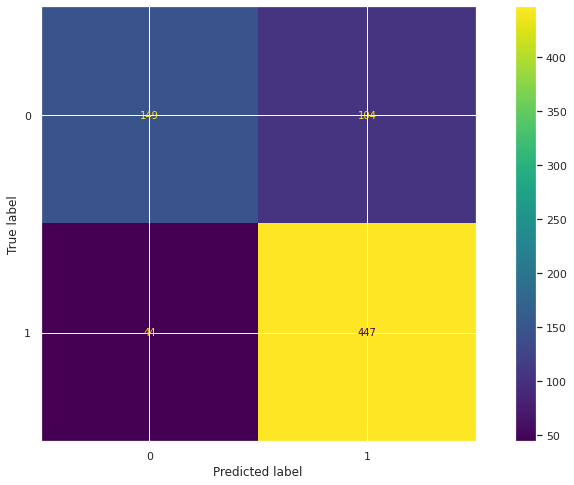

In [91]:
plot_confusion_matrix(rfc1, test_t, y_test)  

In [92]:
answers = pd.read_csv('desafio-1-2021/assets/data/ANSWERS.csv')

In [93]:
answers.drop(labels='ALLOW', axis=1, inplace=True)

In [94]:
profile_answers = ProfileReport(answers, explorative=True)
profile_answers

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [95]:
# Replace "NO_CHECKING" in "CHECKING_BALANCE" for 0.0
answers["CHECKING_BALANCE"].replace({"NO_CHECKING": 0.0}, inplace=True)
answers["CHECKING_BALANCE"] = pd.to_numeric(answers["CHECKING_BALANCE"], errors='coerce', downcast="float")

In [96]:
# Replace "UNKNOWN" in "EXISTING_SAVINGS" for nan values
answers["EXISTING_SAVINGS"].replace({"UNKNOWN": np.NaN}, inplace=True)
answers["EXISTING_SAVINGS"] = pd.to_numeric(answers["EXISTING_SAVINGS"], errors='coerce', downcast="float")

In [97]:
# Drop constant variables
answers.drop(labels=constant_features, axis=1, inplace=True)

In [98]:
# Drop Quasi-constant variables
answers.drop(labels=quasi_constant_features, axis=1, inplace=True)

In [99]:
# Missing categorical imputation
for var in categorical:
    answers[var].fillna('MISSING', inplace=True)

In [100]:
# Median imputation
answers = median_imputer.transform(answers)

In [101]:
# Weight of Evidence Encoding
answers = woe_encoder.transform(answers)

In [102]:
# Ordinal Encoding
answers = ordinal_encoder.transform(answers)

In [103]:
# Drop "ID" column
answers.drop('ID', axis=1, inplace=True)

In [104]:
answers.head()

,CHECKING_BALANCE,PAYMENT_TERM,CREDIT_HISTORY,LOAN_PURPOSE,LOAN_AMOUNT,EXISTING_SAVINGS,EMPLOYMENT_DURATION,INSTALLMENT_PERCENT,SEX,OTHERS_ON_LOAN,CURRENT_RESIDENCE_DURATION,PROPERTY,AGE,INSTALLMENT_PLANS,HOUSING,EXISTING_CREDITS_COUNT,JOB_TYPE,DEPENDENTS,TELEPHONE
0,25.840000,465,5,1.095131,250,38.349998,0,1,0.131942,0.330143,2,2.183620,32,0.556009,0.064381,1,3,1,0
1,-439.720001,120,4,1.095131,250,1.620000,0,2,-0.086748,-1.366558,2,2.183620,25,0.556009,1.526366,1,3,1,0
2,169.449997,527,1,-0.427296,2207,184.970001,6,2,-0.086748,0.330143,3,0.267123,32,0.556009,0.064381,2,1,2,0
3,0.000000,720,0,0.247567,5064,731.030029,6,4,-0.086748,0.330143,2,-0.263463,49,-0.242634,0.064381,2,3,1,0
4,0.000000,420,0,0.116118,3763,396.260010,4,3,0.131942,0.330143,3,-0.263463,46,0.556009,0.064381,1,1,2,1


In [105]:
X.head()

,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
0,-128.300003,0,211.729996,2.0,-0.086748,35.0,3.0,1.0,0.0,6.0,0.267123,1.526366,3.0,900.0,-0.242634,4.0,0.002005,4765.0,0.330143
1,0.000000,0,2906.969971,2.0,-0.086748,51.0,3.0,2.0,1.0,8.0,-0.263463,-1.598971,5.0,1147.0,-0.242634,5.0,-0.427296,7508.0,-1.366558
2,-275.489990,1,31.910000,1.0,0.131942,29.0,3.0,1.0,0.0,7.0,2.183620,0.064381,1.0,279.0,0.556009,1.0,1.095131,250.0,0.330143
3,0.000000,0,2006.390015,2.0,0.131942,36.0,2.0,1.0,1.0,5.0,-1.955210,0.064381,4.0,961.0,-0.242634,4.0,-0.977626,6118.0,0.330143
4,0.000000,3,53.290001,1.0,-0.086748,28.0,3.0,1.0,0.0,1.0,2.183620,1.526366,2.0,248.0,-0.242634,3.0,1.095131,2040.0,0.330143


In [106]:
answers = answers[X.columns]

In [107]:
answers.head()

,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN
0,25.840000,5,38.349998,1,0.131942,32,3,1,0,0,2.183620,0.064381,2,465,0.556009,1,1.095131,250,0.330143
1,-439.720001,4,1.620000,1,-0.086748,25,3,1,0,0,2.183620,1.526366,2,120,0.556009,2,1.095131,250,-1.366558
2,169.449997,1,184.970001,2,-0.086748,32,1,2,0,6,0.267123,0.064381,3,527,0.556009,2,-0.427296,2207,0.330143
3,0.000000,0,731.030029,2,-0.086748,49,3,1,0,6,-0.263463,0.064381,2,720,-0.242634,4,0.247567,5064,0.330143
4,0.000000,0,396.260010,1,0.131942,46,1,2,1,4,-0.263463,0.064381,3,420,0.556009,3,0.116118,3763,0.330143


In [108]:
pred_answers=rfc1.predict(answers)

In [110]:
answers = pd.read_csv('desafio-1-2021/assets/data/ANSWERS.csv')

In [111]:
answers.drop(labels='ALLOW', axis=1, inplace=True)

In [112]:
answers

,ID,CHECKING_BALANCE,PAYMENT_TERM,CREDIT_HISTORY,LOAN_PURPOSE,LOAN_AMOUNT,EXISTING_SAVINGS,EMPLOYMENT_DURATION,INSTALLMENT_PERCENT,SEX,OTHERS_ON_LOAN,CURRENT_RESIDENCE_DURATION,PROPERTY,AGE,INSTALLMENT_PLANS,HOUSING,EXISTING_CREDITS_COUNT,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER
0,1078506,25.84,465,NO_CREDITS,CAR_NEW,250,38.35,0,1,F,NONE,2,REAL_ESTATE,32,STORES,OWN,1,3,1,0,1
1,947575,-439.72,120,ALL_CREDITS_PAID_BACK,CAR_NEW,250,1.62,0,2,M,CO-APPLICANT,2,REAL_ESTATE,25,STORES,RENT,1,3,1,0,1
2,133043,169.45,527,PRIOR_PAYMENTS_DELAYED,RADIO_TV,2207,184.97,6,2,M,NONE,3,SAVINGS_INSURANCE,32,STORES,OWN,2,1,2,0,1
3,1031383,NO_CHECKING,720,OUTSTANDING_CREDIT,CAR_USED,5064,731.03,6,4,M,NONE,2,CAR_OTHER,49,NONE,OWN,2,3,1,0,1
4,491563,NO_CHECKING,420,OUTSTANDING_CREDIT,FURNITURE,3763,396.26,4,3,F,NONE,3,CAR_OTHER,46,STORES,OWN,1,1,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1023481,NO_CHECKING,1116,PRIOR_PAYMENTS_DELAYED,APPLIANCES,3960,1224.22,8,4,F,NONE,3,SAVINGS_INSURANCE,46,NONE,OWN,2,2,1,0,0
996,1211101,-399.5,720,ALL_CREDITS_PAID_BACK,CAR_NEW,1834,57.44,7,3,M,NONE,1,SAVINGS_INSURANCE,27,NONE,OWN,1,3,1,0,1
997,599972,158.3,558,CREDITS_PAID_TO_DATE,CAR_NEW,2348,520.17,1,3,M,CO-APPLICANT,2,SAVINGS_INSURANCE,42,STORES,OWN,1,1,1,0,1
998,1146844,NO_CHECKING,1170,PRIOR_PAYMENTS_DELAYED,FURNITURE,5457,531.02,4,3,M,CO-APPLICANT,3,CAR_OTHER,42,NONE,OWN,1,3,1,1,1


In [113]:
answers['ALLOW'] = pred_answers

In [114]:
answers

,ID,CHECKING_BALANCE,PAYMENT_TERM,CREDIT_HISTORY,LOAN_PURPOSE,LOAN_AMOUNT,EXISTING_SAVINGS,EMPLOYMENT_DURATION,INSTALLMENT_PERCENT,SEX,OTHERS_ON_LOAN,CURRENT_RESIDENCE_DURATION,PROPERTY,AGE,INSTALLMENT_PLANS,HOUSING,EXISTING_CREDITS_COUNT,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,ALLOW
0,1078506,25.84,465,NO_CREDITS,CAR_NEW,250,38.35,0,1,F,NONE,2,REAL_ESTATE,32,STORES,OWN,1,3,1,0,1,1.0
1,947575,-439.72,120,ALL_CREDITS_PAID_BACK,CAR_NEW,250,1.62,0,2,M,CO-APPLICANT,2,REAL_ESTATE,25,STORES,RENT,1,3,1,0,1,1.0
2,133043,169.45,527,PRIOR_PAYMENTS_DELAYED,RADIO_TV,2207,184.97,6,2,M,NONE,3,SAVINGS_INSURANCE,32,STORES,OWN,2,1,2,0,1,1.0
3,1031383,NO_CHECKING,720,OUTSTANDING_CREDIT,CAR_USED,5064,731.03,6,4,M,NONE,2,CAR_OTHER,49,NONE,OWN,2,3,1,0,1,1.0
4,491563,NO_CHECKING,420,OUTSTANDING_CREDIT,FURNITURE,3763,396.26,4,3,F,NONE,3,CAR_OTHER,46,STORES,OWN,1,1,2,1,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1023481,NO_CHECKING,1116,PRIOR_PAYMENTS_DELAYED,APPLIANCES,3960,1224.22,8,4,F,NONE,3,SAVINGS_INSURANCE,46,NONE,OWN,2,2,1,0,0,0.0
996,1211101,-399.5,720,ALL_CREDITS_PAID_BACK,CAR_NEW,1834,57.44,7,3,M,NONE,1,SAVINGS_INSURANCE,27,NONE,OWN,1,3,1,0,1,1.0
997,599972,158.3,558,CREDITS_PAID_TO_DATE,CAR_NEW,2348,520.17,1,3,M,CO-APPLICANT,2,SAVINGS_INSURANCE,42,STORES,OWN,1,1,1,0,1,1.0
998,1146844,NO_CHECKING,1170,PRIOR_PAYMENTS_DELAYED,FURNITURE,5457,531.02,4,3,M,CO-APPLICANT,3,CAR_OTHER,42,NONE,OWN,1,3,1,1,1,0.0


In [115]:
answers.to_csv('MY_ANSWERS_DEF_1.csv',index=False)